# NAME - MOHIT CHAUHAN
### LETSGROWMORE INTERSHIP


##### IMPORT LIBRARIES

### ML FACIAL RECOGNITION RECOGNITION TO DETECT MOOD AND SUGGEST SONGS  ACCORDINGLY 
##### Explanation:
* Import the libraries.
* Load the train datasets and test datasets separately.
* Then we can visualize the data and plot the graphs.
* Then after preprocessing the data we can build the model.
* Now we can train the model.
* Then save and load the model.
* Now  we evalute the model.
* Then validate the trainning and testing dataset.
* Now we can test the model with new image.

In [20]:
import numpy as np
import cv2
import os
import random
from skimage.io import imread
import pandas as pd
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization, Conv2D,MaxPooling2D,Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from IPython.display import Audio

In [21]:
print("TensorFlow version :", tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

TensorFlow version : 2.10.0
Num GPUs Available:  0


##### LOADING THE DATASET

In [22]:
train_dir = r'c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\train'
test_dir = r'c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\test'

row, col = 48, 48
classes = 7

def count_exp(path, set_):
    dict_ = {}
    for expression in os.listdir(path):
        dir_ = path +"/" +expression
        dict_[expression] = len(os.listdir(dir_))
    df = pd.DataFrame(dict_, index=[set_])
    return df
train_count = count_exp(train_dir, 'train')
test_count = count_exp(test_dir, 'test')
print(train_count)
print(test_count)

       angry  disgust  fear  happy  neutral   sad  surprise
train   3995      436  4097   7215     4965  4830      3171
      angry  disgust  fear  happy  neutral   sad  surprise
test    958      111  1024   1774     1233  1247       831


##### DATA VISUALIZATION

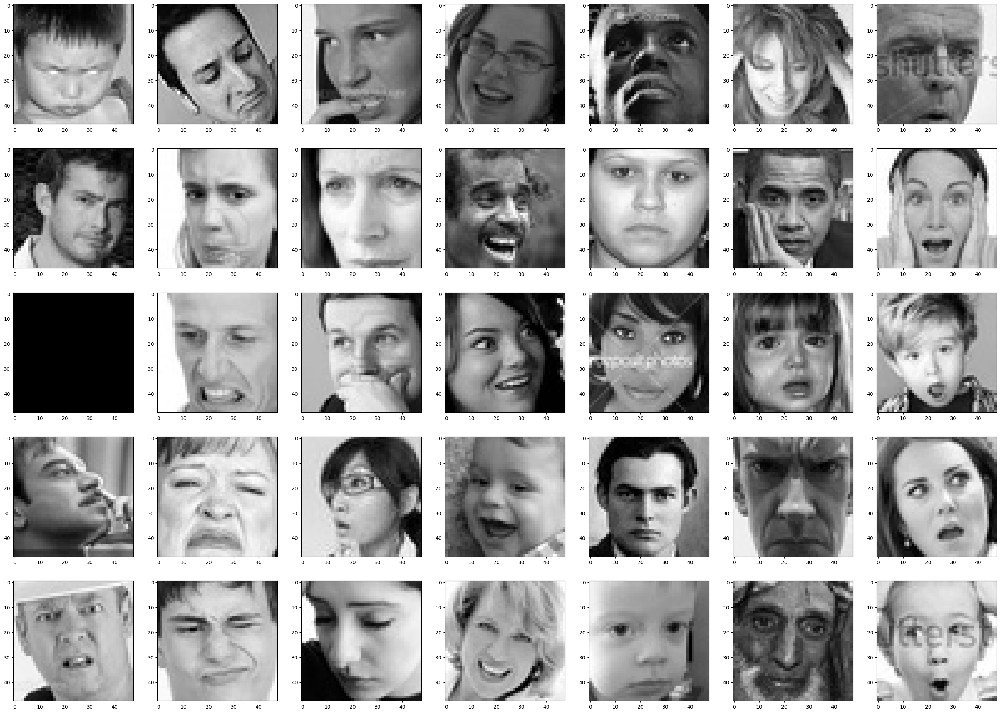

In [23]:
from skimage.io import imread
train_dir = r'c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\train'
test_dir = r'c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\test'
total_labels = len(os.listdir(train_dir))

fig, ax = plt.subplots(nrows=5, ncols=total_labels, figsize=(35, 25))
for x in range(5):
    for y,v in zip(range(total_labels),os.listdir(train_dir)):
        ax[x][y].imshow(imread(train_dir+v+'/'+os.listdir(train_dir+v)[x]), cmap='gray')

plt.show()

##### PLOT THE GRAPH

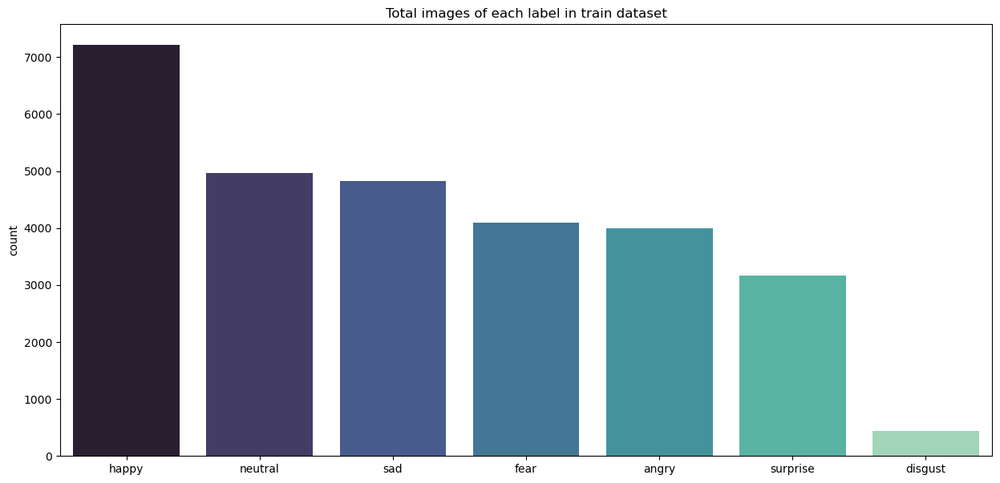

In [24]:
df = {}
for i in os.listdir(train_dir):
    directory = train_dir + i
    df[i] = len(os.listdir(directory))
df = pd.DataFrame(df, index=["total"]).transpose().sort_values("total", ascending=False)

plt.figure(figsize=(15,7))
sns.barplot(x=df.index, y="total", palette="mako", data=df)
plt.ylabel("count")
plt.title("Total images of each label in train dataset")
plt.show()

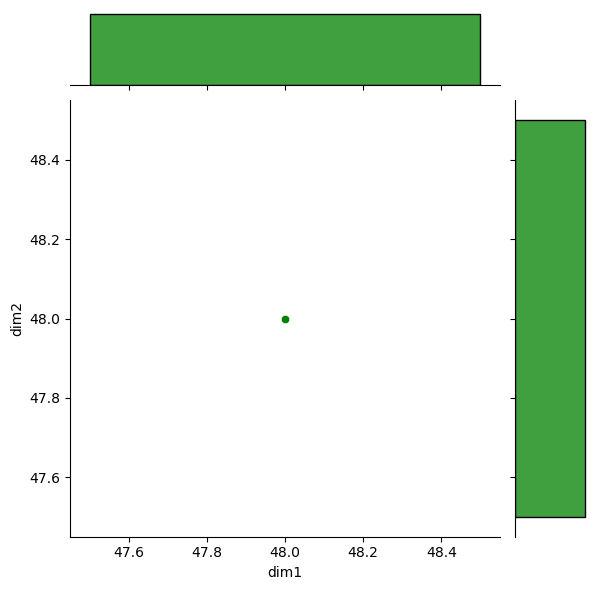

In [25]:
happy = os.listdir(train_dir+'happy/')
dim1, dim2 = [], []

for img_filename in happy:
    img = imread(train_dir+'happy/'+img_filename)
    d1, d2 = img.shape
    dim1.append(d1)
    dim2.append(d2)

df = pd.DataFrame({'dim1': dim1, 'dim2': dim2})
sns.jointplot(data=df, x='dim1', y='dim2', color='g')
plt.show()

##### DATA PREPROCESSING

In [26]:
train_gen = ImageDataGenerator(rescale=1/255,
                                rotation_range=40,
                                width_shift_range=0.2,
                                height_shift_range=0.2,
                                shear_range=0.2,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                fill_mode='nearest')

test_gen = ImageDataGenerator(rescale=1/255)

img_shape = (int(np.mean(dim1)), int(np.mean(dim2)), 1)

train_generator = train_gen.flow_from_directory(directory=train_dir,
                                                target_size=(img_shape[0], img_shape[1]),
                                                color_mode='grayscale',
                                                batch_size=64,
                                                class_mode='categorical',
                                                shuffle=True)

test_generator = test_gen.flow_from_directory(directory=test_dir,
                                                target_size=(img_shape[0], img_shape[1]),
                                                color_mode='grayscale',
                                                batch_size=64,
                                                class_mode='categorical',
                                                shuffle=False)

Found 28709 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


##### BUILD THE MODEL

In [27]:
model = Sequential()

model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu', input_shape=img_shape))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Flatten())

model.add(Dense(512, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(units=len(os.listdir(train_dir)), activation='softmax'))

model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 48, 48, 64)        640       
                                                                 
 batch_normalization_4 (Batc  (None, 48, 48, 64)       256       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 24, 24, 64)       0         
 2D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 24, 24, 64)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 24, 24, 128)       73856     
                                                                 
 batch_normalization_5 (Batc  (None, 24, 24, 128)     

##### TRAIN THE MODEL

In [28]:
model.compile(optimizer=Adam(learning_rate=0.0001, 
                             decay=1e-6), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

In [29]:
steps_per_epoch = train_generator.n // train_generator.batch_size
validation_steps = test_generator.n // test_generator.batch_size
num_epochs = 20

history = model.fit(train_generator,
                    epochs=num_epochs,
                    verbose=1,
                    #callbacks=callbacks,
                    validation_data=test_generator,
                    steps_per_epoch=steps_per_epoch,
                    validation_steps=validation_steps)

Epoch 1/20
448/448 [==============================] - 170s 378ms/step - loss: 1.8777 - accuracy: 0.2262 - val_loss: 2.4217 - val_accuracy: 0.1890
Epoch 2/20
448/448 [==============================] - 168s 376ms/step - loss: 1.8004 - accuracy: 0.2462 - val_loss: 1.7887 - val_accuracy: 0.2599
Epoch 3/20
448/448 [==============================] - 172s 384ms/step - loss: 1.7868 - accuracy: 0.2573 - val_loss: 1.7410 - val_accuracy: 0.2780
Epoch 4/20
448/448 [==============================] - 170s 379ms/step - loss: 1.7749 - accuracy: 0.2619 - val_loss: 1.7006 - val_accuracy: 0.3002
Epoch 5/20
448/448 [==============================] - 170s 378ms/step - loss: 1.7560 - accuracy: 0.2733 - val_loss: 1.6604 - val_accuracy: 0.3382
Epoch 6/20
448/448 [==============================] - 169s 377ms/step - loss: 1.7409 - accuracy: 0.2910 - val_loss: 1.6239 - val_accuracy: 0.3545
Epoch 7/20
448/448 [==============================] - 169s 378ms/step - loss: 1.7145 - accuracy: 0.3050 - val_loss: 1.6353 -

In [30]:
model.save("model.h5")

##### EVALUATE THE MODEL

In [31]:
# Evaluate the model
test_loss, test_acc = model.evaluate(test_generator)
print("validation accuracy :", str(test_acc*100)+"%")
print("validation loss :", test_loss)

113/113 [==============================] - 11s 95ms/step - loss: 1.3005 - accuracy: 0.5018
validation accuracy : 50.181108713150024%
validation loss : 1.3004701137542725


##### TRAIN AND VALIDATION

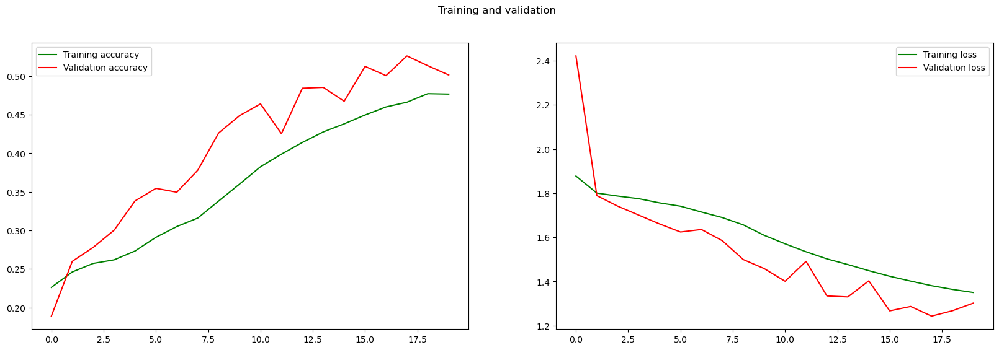

In [32]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
ax[0].plot(epochs, acc, 'g', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'r', label='Validation accuracy')
ax[0].legend(loc=0)
ax[1].plot(epochs, loss, 'g', label='Training loss')
ax[1].plot(epochs, val_loss, 'r', label='Validation loss')
ax[1].legend(loc=0)

plt.suptitle('Training and validation')
plt.show()

113/113 [==============================] - 11s 96ms/step
              precision    recall  f1-score   support

       angry       0.30      0.62      0.41       958
     disgust       0.33      0.01      0.02       111
        fear       0.34      0.15      0.21      1024
       happy       0.82      0.69      0.75      1774
     neutral       0.49      0.49      0.49      1233
         sad       0.43      0.34      0.38      1247
    surprise       0.56      0.73      0.63       831

    accuracy                           0.50      7178
   macro avg       0.47      0.43      0.41      7178
weighted avg       0.52      0.50      0.49      7178





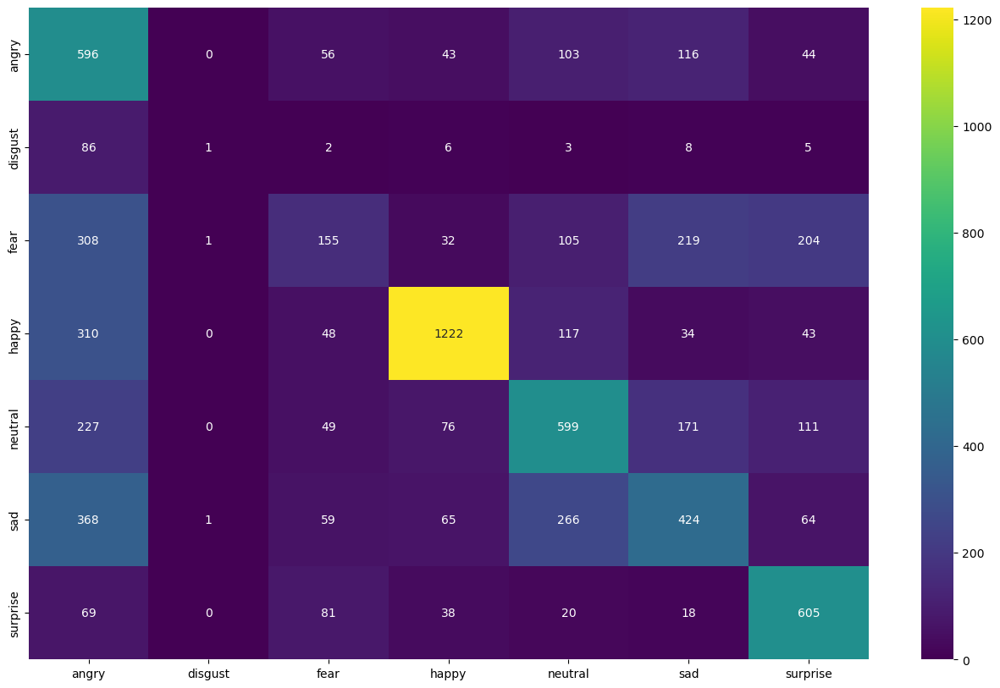

In [33]:
# confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

y_pred = np.argmax(model.predict(test_generator), axis=-1)
print(classification_report(test_generator.classes, y_pred, target_names=test_generator.class_indices.keys()), end='\n\n\n')

cm = confusion_matrix(test_generator.classes, y_pred)
plt.figure(figsize=(16,10))
sns.heatmap(cm, cmap=plt.cm.viridis, annot=True, fmt='.0f', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.show()

##### TEST MODEL WITH NEW IMAGE

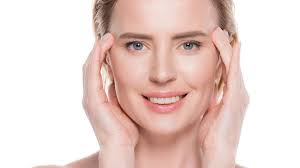

In [48]:
image = cv2.imread("c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\images.jpg")
from IPython.display import Image
Image(filename='c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\images.jpg')

In [49]:
import cv2
from tensorflow.python.keras.models import load_model
import os

# Load the trained model
model = tf.keras.models.load_model("model.h5",
                                   custom_objects={'Functional': tf.keras.models.Model})
# A list of emoticon categories
EMOTIONS = ['Angry', 'Disgust', 'Happy', 'Sad', 'Surprise', 'Neutral']
# Load image
img = image

# Trim the image to 48 x 48, convert to grayscale, and normalize
frame = cv2.resize(img, (48, 48), interpolation=cv2.INTER_LINEAR)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) / 255.0

# Reshape the image dimension
gray = gray.reshape(1, 48, 48, 1)

# Output the prediction
predicts = model.predict(gray)[0]
label = EMOTIONS[predicts.argmax()]
for (i, j) in zip(range(7), EMOTIONS):
    predictss = predicts[i]
    print("{:^10s}".format(j) + " prediction rate is   {0:.2f}%".format(predictss))
print("\n\n The system considers this expression to be:", label)

1/1 [==============================] - 0s 115ms/step
  Angry    prediction rate is   0.13%
 Disgust   prediction rate is   0.03%
  Happy    prediction rate is   0.22%
   Sad     prediction rate is   0.10%
 Surprise  prediction rate is   0.13%
 Neutral   prediction rate is   0.18%


 The system considers this expression to be: Happy


In [50]:
import random
from IPython.display import Audio, display

if label == 'Angry':
    path = "c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Angry"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Angry\\' + d, autoplay=True)
    display(audio)

elif label == 'Disgust':
    path = "c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Disgust\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Disgust\\' + d, autoplay=True)
    display(audio)

elif label == "Happy":
    path = "c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Happy\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Happy\\' + d, autoplay=True)
    display(audio)

elif label == 'Sad':
    path = "c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Sad\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Sad\\' + d, autoplay=True)
    display(audio)

elif label == 'Surprise':
    path = "c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Surprise\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\Surprise\\' + d, autoplay=True)
    display(audio)

elif label == 'Neutral':
    path = "c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\\Neutral"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='c\project10\ML Facial Recognition To Detect Mood And Suggest Songs Accordingly\songs\\Neutral\\' + d, autoplay=True)
    display(audio)

Now Playing: Happy.mp3
